<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Importo-Pacchetti" data-toc-modified-id="Importo-Pacchetti-1">Importo Pacchetti</a></span></li><li><span><a href="#Metodo-suggerito-dal-professore-con-qualche-modifica" data-toc-modified-id="Metodo-suggerito-dal-professore-con-qualche-modifica-2">Metodo suggerito dal professore con qualche modifica</a></span></li><li><span><a href="#Metodo-suggerito-dal-professore-seguito-alla-lettera" data-toc-modified-id="Metodo-suggerito-dal-professore-seguito-alla-lettera-3">Metodo suggerito dal professore seguito alla lettera</a></span></li></ul></div>

## Importo Pacchetti

In [1]:
using Random, Distributions
using Plots
using DelimitedFiles

## Metodo suggerito dal professore con qualche modifica

In [24]:
function param()
    a = 1
    b = 2
    M = 30
    N = 10^6
    return a, b, M, N
end

param (generic function with 1 method)

In [3]:
function step_func(x_i, M, b, a)
    """Stepper for random Weierstrass"""
    # Genero numero random
    x = rand(Uniform(0, 1))
    
    # Normalizzazione
    k = (M-1)/M
    
    # Inverto per il J beccato
    J_real = -log(x)/log(M)
    J = floor(Int64, abs(J_real)) # J deve essere intero
    
    # Genero un segno
    sign_rnd = rand(Uniform(0, 1))
    # Compact if else:
    s = sign_rnd < 0.5 ? -1 : 1 # Se sign_rnd < 0.5 => s = -1, else s = 1
    
    # Faccio l'incremento
    return x_i + s * a * b^J
end

step_func (generic function with 1 method)

In [4]:
function create_path(M,b)
    a, b, M, N = param()
    x = zeros(N)
    y = zeros(N)
    for i = 1:N-1 
        x[i+1] = step_func(x[i], M, b, a)
        y[i+1] = step_func(y[i], M, b, a)
    end
    return x,y
end

create_path (generic function with 1 method)

In [8]:
function test()
    a, b, M, N = param()
    @time create_path(M,b)
end
test()

  0.135359 seconds (11 allocations: 15.278 MiB)


([0.0, -1.0, 0.0, -2.0, -1.0, -2.0, -3.0, -4.0, -5.0, -4.0  …  -3240.0, -3239.0, -3240.0, -3242.0, -3240.0, -3241.0, -3242.0, -3241.0, -3240.0, -3239.0], [0.0, 1.0, 2.0, 1.0, -1.0, 3.0, 4.0, 5.0, 1.0, 0.0  …  -14608.0, -14610.0, -14611.0, -14612.0, -14611.0, -14612.0, -14611.0, -14613.0, -14614.0, -14613.0])

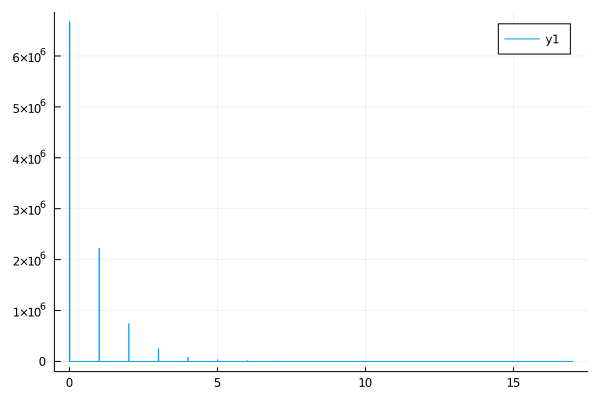

In [28]:
J = []
for i = 0:N
    x_rnd = rand(Uniform(0, 1))
    append!(J, Int64(floor(abs(-log(x_rnd)/log(M)))))
end
h = histogram(J)


In [25]:
function Plotter()
    a, b, M, N = param()
    x, y = create_path(M,b)
    println("Path created")
    plt = plot(x, y, label = "M=$(M), b=$(b)", dpi = 300)
    #display(plt)
    savefig(plt, "../../figures/lez_10_Weier_M_$(M)_b_$(b)")
end
Plotter()

Path created


## Metodo suggerito dal professore seguito alla lettera

In [84]:
function step_func1(x_i, M, b, a)
    """Stepper for random Weierstrass"""
    # Genero numero random
    x = rand(Uniform(0, 1))
     
    J_real = floor(Int64, abs(log(1-x)/log(M)-1))
    J = J_real # J deve essere intero
    # Genero un segno
    sign_rnd = rand(Uniform(0, 1))
    # Compact if else:
    s = sign_rnd < 0.5 ? -1 : 1 # Se sign_rnd < 0.5 => s = -1, else s = 1
    
    # Faccio l'incremento
    return x_i + s * a * b^J
end

step_func1 (generic function with 1 method)

In [87]:
a = 1
b = 2
M = 3

x = [0.]
y = [0.]
N = 10^6
for i = 0:N 
    append!(x, step_func1(last(x), M, b, a))
    append!(y, step_func1(last(y), M, b, a))
end

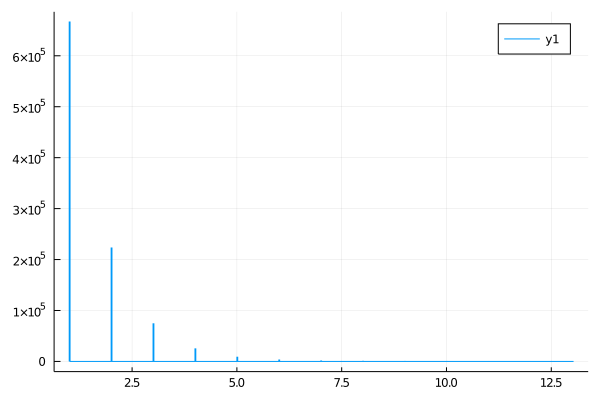

In [83]:
J = []
for i = 0:N
    x_rnd = rand(Uniform(0, 1))
    J_real = floor(Int64, abs(log(1-x_rnd)/log(M)-1))
    append!(J, J_real)
end
h = histogram(J)
display(h)

In [88]:
my_plot = plot(x, y, label = "M=$(M), b=$(b)") #dp1 = 100